In [12]:
# Importing necessary libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error, r2_score, explained_variance_score, mean_absolute_error, median_absolute_error
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats
import seaborn as sns
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Importing the data and creating the data frame

url = 'https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv'
temp_df = pd.read_csv(url, sep=',')
temp_df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
# Shape of the data frame, 7752 shows number of rows and 25 shows number of columns

temp_df.shape

(7752, 25)

In [4]:
# Unique values in each column

temp_df.nunique()

station               25
Date                 310
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7672
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7675
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7569
LDAPS_CC2           7582
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            183
Next_Tmin            157
dtype: int64

In [6]:
# Statstical Analysis of the data frame

temp_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


In [8]:
# Datatypes of the dataframe

temp_df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [7]:
# Calcuating null values in the data

temp_df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
# Since no column has null values more than 50% of the rows of the data, so we cannot drop any column straight forward, we have to do modifications for all those columns

# Replacing Null values in some columns with mean or median value of the particular column

for i in temp_df.columns:
    ptmax_mean = temp_df['Present_Tmax'].mean()
    temp_df['Present_Tmax'].fillna(ptmax_mean, inplace=True)

for i in temp_df.columns:
    ptmin_mean = temp_df['Present_Tmin'].mean()
    temp_df['Present_Tmin'].fillna(ptmin_mean, inplace=True)

for i in temp_df.columns:
    ldapsrhmin_mean = temp_df['LDAPS_RHmin'].mean()
    temp_df['LDAPS_RHmin'].fillna(ldapsrhmin_mean, inplace=True)

for i in temp_df.columns:
    ldapsrhmax_mean = temp_df['LDAPS_RHmax'].mean()
    temp_df['LDAPS_RHmax'].fillna(ldapsrhmax_mean, inplace=True)

for i in temp_df.columns:
    ldapstmaxlapse_median = temp_df['LDAPS_Tmax_lapse'].median()
    temp_df['LDAPS_Tmax_lapse'].fillna(ldapstmaxlapse_median, inplace=True)

for i in temp_df.columns:
    ldapstminlapse_median = temp_df['LDAPS_Tmin_lapse'].median()
    temp_df['LDAPS_Tmin_lapse'].fillna(ldapstminlapse_median, inplace=True)

for i in temp_df.columns:
    ldapsws_mean = temp_df['LDAPS_WS'].mean()
    temp_df['LDAPS_WS'].fillna(ldapsws_mean, inplace=True)

for i in temp_df.columns:
    ldapslh_mean = temp_df['LDAPS_LH'].mean()
    temp_df['LDAPS_LH'].fillna(ldapslh_mean, inplace=True)

# Replacing Null values of other columns with the Backward fill method (Value of next non-null value) or Forward fill method (Value of previous non-null value)

temp_df['station'].fillna(method='bfill', inplace=True)
temp_df['Date'].fillna(method='bfill', inplace=True)
temp_df['LDAPS_CC1'].fillna(method='bfill', inplace=True)
temp_df['LDAPS_CC2'].fillna(method='bfill', inplace=True)
temp_df['LDAPS_CC3'].fillna(method='bfill', inplace=True)
temp_df['LDAPS_CC4'].fillna(method='bfill', inplace=True)
temp_df['LDAPS_PPT1'].fillna(method='ffill', inplace=True)
temp_df['LDAPS_PPT2'].fillna(method='ffill', inplace=True)
temp_df['LDAPS_PPT3'].fillna(method='ffill', inplace=True)
temp_df['LDAPS_PPT4'].fillna(method='ffill', inplace=True)
temp_df['Next_Tmax'].fillna(method='ffill', inplace=True)
temp_df['Next_Tmin'].fillna(method='ffill', inplace=True)

temp_df.isnull().sum()

station             2
Date                2
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

As we can see, the two columns namely Station and Date does not have any impact after null value treatment, and they are also not important for model training, thus we can drop them

In [10]:
# Dropping unnecessary column

temp_df.drop(['station', 'Date'], axis=1, inplace = True)
temp_df.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


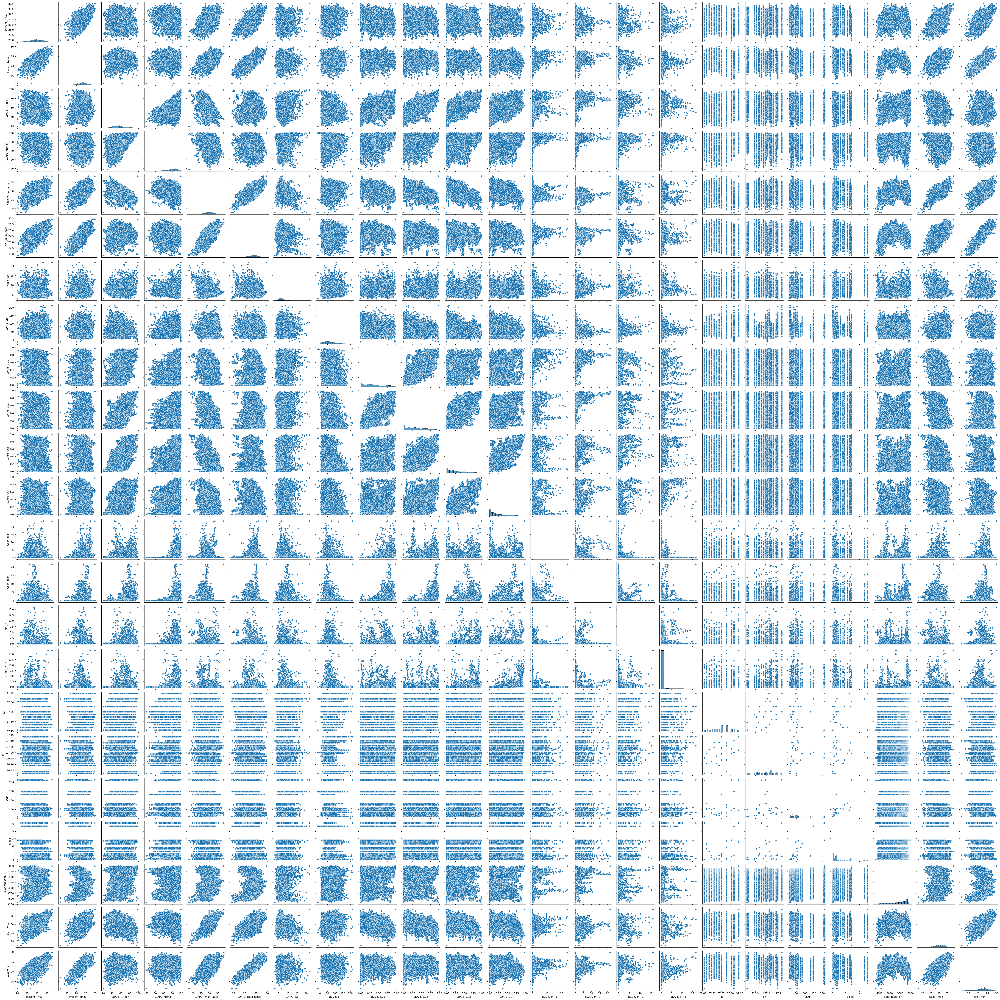

In [11]:
# Pairplot to understand the correlation between every numerical variable with each other

sns.pairplot(temp_df)
plt.show()

In [14]:
# Building the correlation matrix

corrs = temp_df.corr()
figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    showscale=True)
figure.show()

## Model - 1 : Predicting Next Day Minimum Temperature - Next_Tmin

In [15]:
# Extracting the independent and dependent variables

X = temp_df.drop('Next_Tmin', axis=1)
y = temp_df['Next_Tmin']

In [16]:
# Splitting the dataset

from sklearn.model_selection import train_test_split, GridSearchCV
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

In [17]:
from xgboost import XGBRegressor

# Create an XGBoost Regressor
xgb_regressor = XGBRegressor()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
}

In [18]:
# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(xgb_regressor, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
best_xgb_regressor = grid_search.best_estimator_

# Predictions
y_pred = best_xgb_regressor.predict(X_test)

# Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print("Best XGBoost Regressor MSE:", mse)

Best XGBoost Regressor MSE: 0.32460928999174


In [21]:
# Evaluation metrics for determining the model performance

print("R Sqaure :", r2_score(y_test, y_pred))
print()
print("Explained Variance Score :", explained_variance_score(y_test, y_pred))
print()
print("Mean Absolute Error :", mean_absolute_error(y_test, y_pred))
print()
print("Median Absolute Error :", median_absolute_error(y_test, y_pred))

R Sqaure : 0.9483241925294316

Explained Variance Score : 0.9483300600710616

Mean Absolute Error : 0.43017168395523875

Median Absolute Error : 0.3422748565673821


## Model - 2 : Predicting Next Day Maximum Temperature - Next_Tmax

In [22]:
# Extracting the independent and dependent variables

X = temp_df.drop('Next_Tmax', axis=1)
y = temp_df['Next_Tmax']

In [23]:
# Splitting the dataset

from sklearn.model_selection import train_test_split, GridSearchCV
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

In [24]:
from xgboost import XGBRegressor

# Create an XGBoost Regressor
xgb_regressor = XGBRegressor()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
}

In [25]:
# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(xgb_regressor, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
best_xgb_regressor = grid_search.best_estimator_

# Predictions
y_pred = best_xgb_regressor.predict(X_test)

# Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print("Best XGBoost Regressor MSE:", mse)

Best XGBoost Regressor MSE: 0.5832308797738665


In [26]:
# Evaluation metrics for determining the model performance

print("R Sqaure :", r2_score(y_test, y_pred))
print()
print("Explained Variance Score :", explained_variance_score(y_test, y_pred))
print()
print("Mean Absolute Error :", mean_absolute_error(y_test, y_pred))
print()
print("Median Absolute Error :", median_absolute_error(y_test, y_pred))

R Sqaure : 0.9412980876267687

Explained Variance Score : 0.9413023386430276

Mean Absolute Error : 0.5856420173866375

Median Absolute Error : 0.45822410583496165
